In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 6.2 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of mkl-fft to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of mkl-random to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of mkl-umath to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 24.9 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 94.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 87.3 MB/s eta 0:00:00:00:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 77.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [3]:
import ultralytics
ultralytics.checks()

Ultralytics 8.3.235 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 6567.2/8062.4 GB disk)


In [5]:


from roboflow import Roboflow
rf = Roboflow(api_key="dzZEOQuovIy0ctNJW33A")
project = rf.workspace("research-on-plant-disease").project("plant-disease-detection-4htzn-ciqla")
version = project.version(1)
dataset = version.download("yolov11")
                

loading Roboflow workspace...
loading Roboflow project...


In [6]:
dataset.location

'/kaggle/working/plant-disease-detection-1'

In [8]:
!pip install "numpy<2.0" --force-reinstall --no-cache-dir


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 289.7 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: numpy
    Found existing installation: numpy 2.2.6
    Uninstalling numpy-2.2.6:
      Successfully uninstalled numpy-2.2.6
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 2.12.0 requires google-cloud-bigquery-storage<3.0.0,>=2.30.0, which is not installed.
datasets 4.4.1 requires pyarrow>=21.0.0, but you have pyarrow 19.0.1 which is incompatible.
cesium 0.12.4 requires numpy<3.0,>=2.0, but you have numpy 1.26.4 which is incompatible.
google-colab 1.0.0 requires notebook==6.5.7, but you have notebook 6.5.4 which is incompatible.
google-colab 1.0.0 requires pandas==2.2.2, but you have pandas 2.2.3 which is incompatible.
google-colab 1.0.0 requires requests==2.32.

In [9]:
!pip install "numpy<2.0" "matplotlib>=3.7,<3.9" --force-reinstall --no-cache-dir


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 113.2/113.2 kB 11.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 249.1 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 307.3 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 355.2/355.2 kB 351.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.0/5.0 MB 345.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 374.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.5/66.5 kB 238.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 304.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 113.9/113.9 kB 266.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 229.9/229.9 kB 376.8 MB/s eta 0:00:00
  Attempting uninstall: six
    Found existing installation: six 1.17.0
    Uninstalling six-1.17.0:
   

In [ ]:
import os, sys
os._exit(0)


In [1]:
!yolo train task=detect \
  data=/kaggle/working/plant-disease-detection-1/data.yaml \
  model=yolo11x.pt \
  epochs=10 \
  imgsz=512 \
  batch=24 \
  close_mosaic=10 \
  project=/kaggle/working/ablation_runs \
  name=imgsz_512 \
  workers=4


Ultralytics 8.3.235 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=24, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/plant-disease-detection-1/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11x.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=imgsz_5122, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspec

In [4]:
import pandas as pd

df = pd.read_csv("/kaggle/working/ablation_runs/imgsz_5122/results.csv")
df



,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,620.098,0.88402,1.96921,1.37789,0.61954,0.55750,0.65815,0.51199,0.83041,2.22751,1.25103,0.000123,0.000123,0.000123
1,2,1241.650,0.90516,1.42122,1.36481,0.58114,0.59930,0.63721,0.50039,0.89807,2.28891,1.29551,0.000222,0.000222,0.000222
2,3,1861.900,0.91488,1.34417,1.37202,0.62160,0.60211,0.65638,0.51010,0.88207,2.03875,1.28657,0.000297,0.000297,0.000297
3,4,2479.210,0.81306,1.06770,1.29388,0.77205,0.71943,0.80146,0.66299,0.78215,1.45552,1.18794,0.000260,0.000260,0.000260
4,5,3096.260,0.75231,0.91391,1.24251,0.77135,0.74674,0.82829,0.70860,0.63721,1.16564,1.07460,0.000223,0.000223,0.000223
5,6,3713.650,0.68913,0.76116,1.19029,0.74320,0.79324,0.86163,0.74854,0.60594,1.11907,1.07744,0.000187,0.000187,0.000187
6,7,4331.160,0.65276,0.66706,1.16808,0.80159,0.84153,0.87808,0.77551,0.53653,0.98987,1.02009,0.000150,0.000150,0.000150
7,8,4948.320,0.61467,0.57796,1.14225,0.85868,0.82377,0.89234,0.79120,0.52822,0.97272,1.00945,0.000114,0.000114,0.000114
8,9,5565.790,0.58282,0.50389,1.11690,0.87685,0.88144,0.92933,0.83468,0.51220,0.85698,1.01529,0.000077,0.000077,0.000077
9,10,6182.630,0.55095,0.45395,1.09485,0.88188,0.88847,0.93886,0.85188,0.47233,0.77244,0.96904,0.000040,0.000040,0.000040


In [5]:
df.tail(1)

,epoch,time,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
9,10,6182.63,0.55095,0.45395,1.09485,0.88188,0.88847,0.93886,0.85188,0.47233,0.77244,0.96904,0.00004,0.00004,0.00004


In [ ]:
!zip -r working_files.zip /kaggle/working/


  adding: kaggle/working/ (stored 0%)
  adding: kaggle/working/yolo11x.pt (deflated 8%)
  adding: kaggle/working/.virtual_documents/ (stored 0%)
  adding: kaggle/working/plant-disease-detection-1/ (stored 0%)
  adding: kaggle/working/plant-disease-detection-1/data.yaml (deflated 60%)
  adding: kaggle/working/plant-disease-detection-1/README.roboflow.txt (deflated 50%)
  adding: kaggle/working/plant-disease-detection-1/train/ (stored 0%)
  adding: kaggle/working/plant-disease-detection-1/train/labels.cache (deflated 70%)
  adding: kaggle/working/plant-disease-detection-1/train/labels/ (stored 0%)
  adding: kaggle/working/plant-disease-detection-1/train/labels/IMG_7869-removebg-preview-1-Copy-Copy_jpg.rf.934ddd3e1d1fd7ae4baf2b489974bd56.txt (deflated 20%)
  adding: kaggle/working/plant-disease-detection-1/train/labels/eb52b160-081d-4e69-8446-cabecf9b14ad___UF-GRC_YLCV_Lab-01494_JPG.rf.fc242b2930d4f4322df7836ae2c3ddef.txt (deflated 25%)
  adding: kaggle/working/plant-disease-detection-1/t

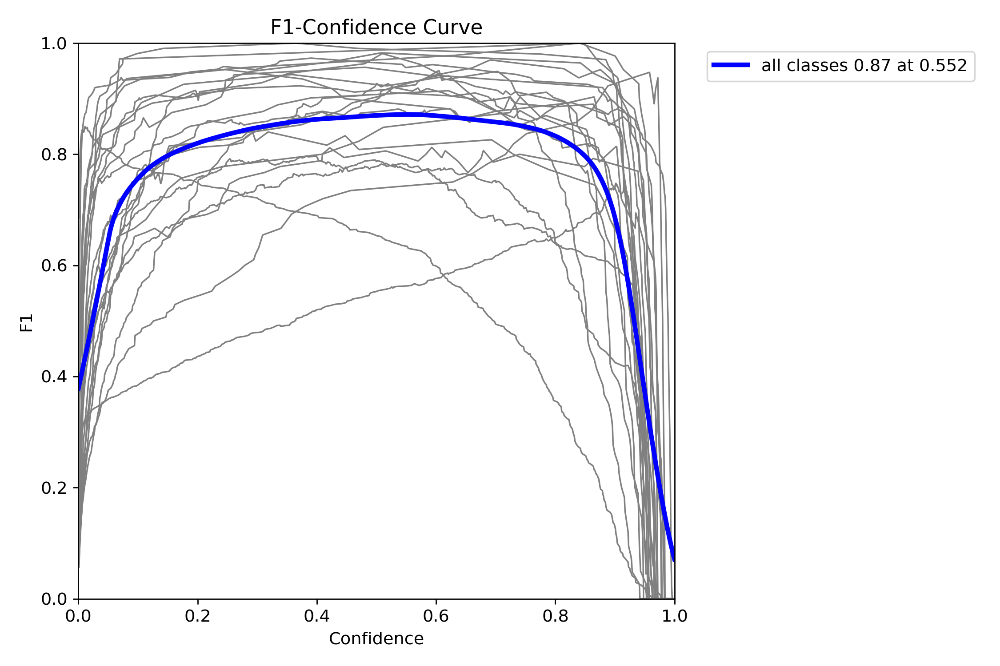

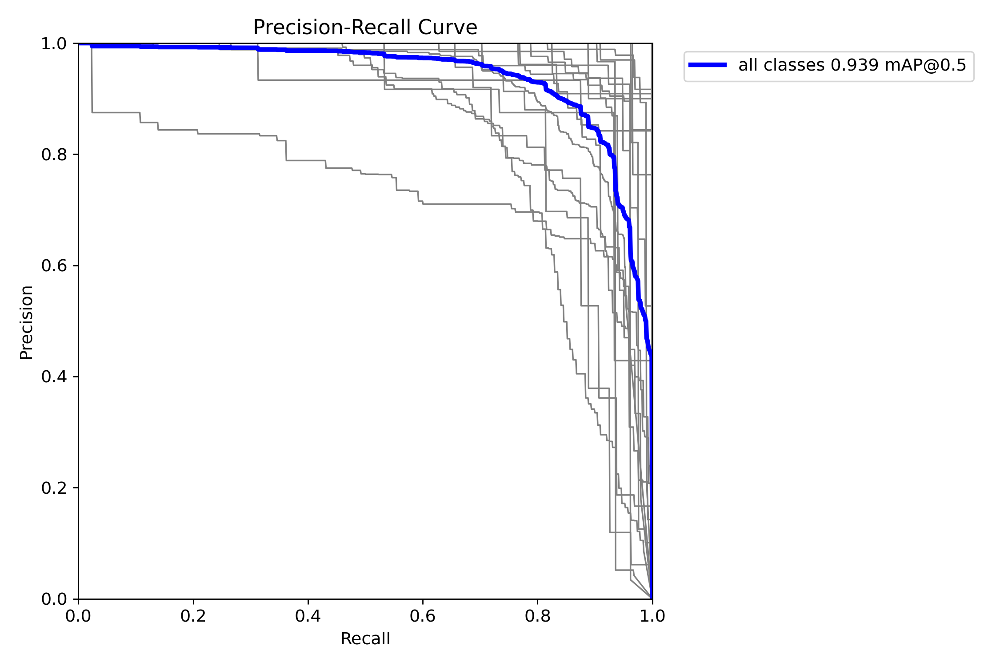

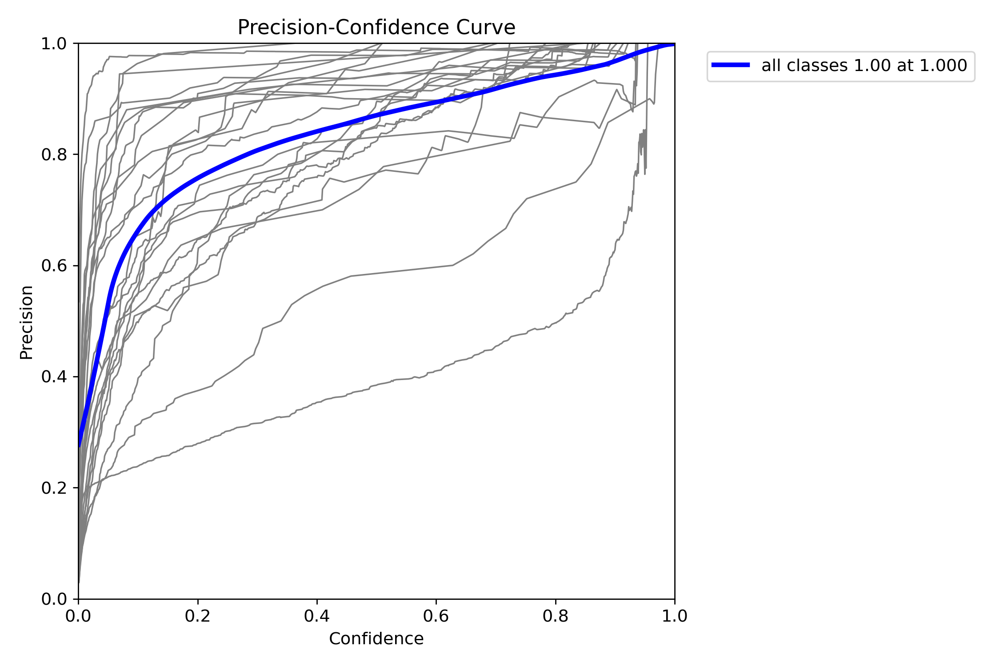

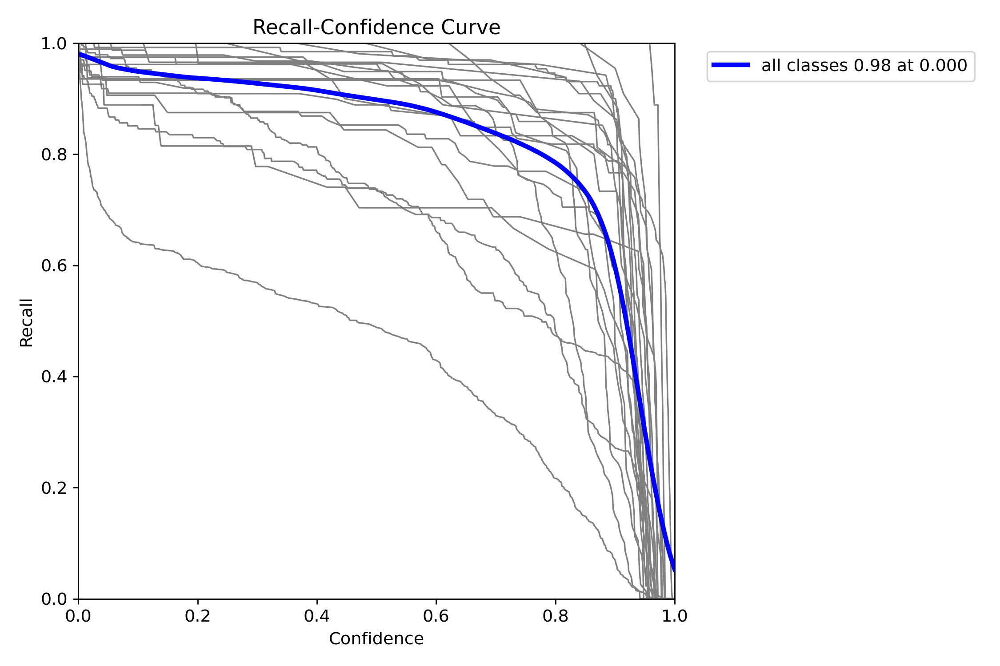

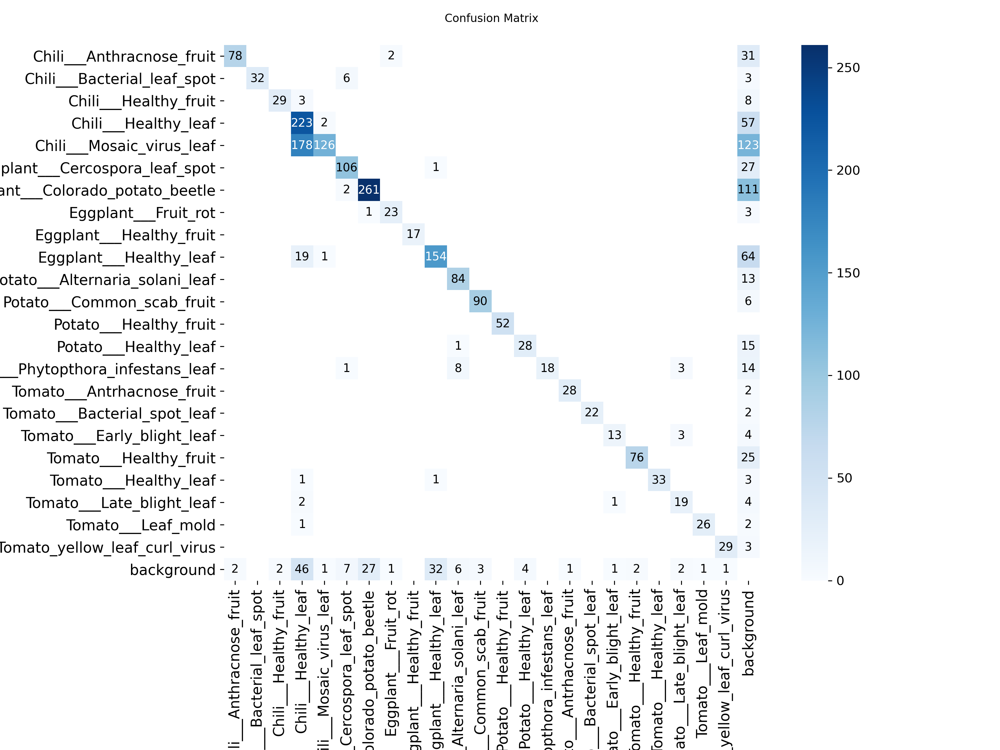

...

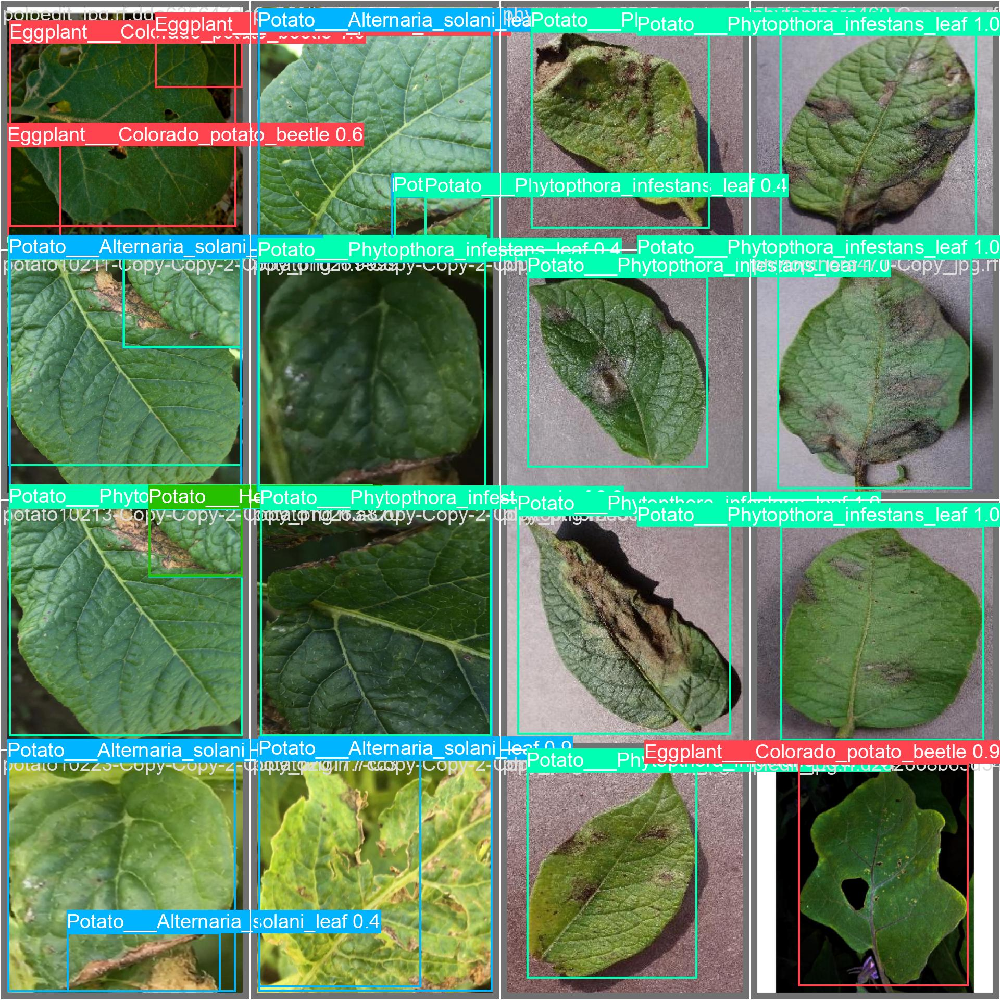

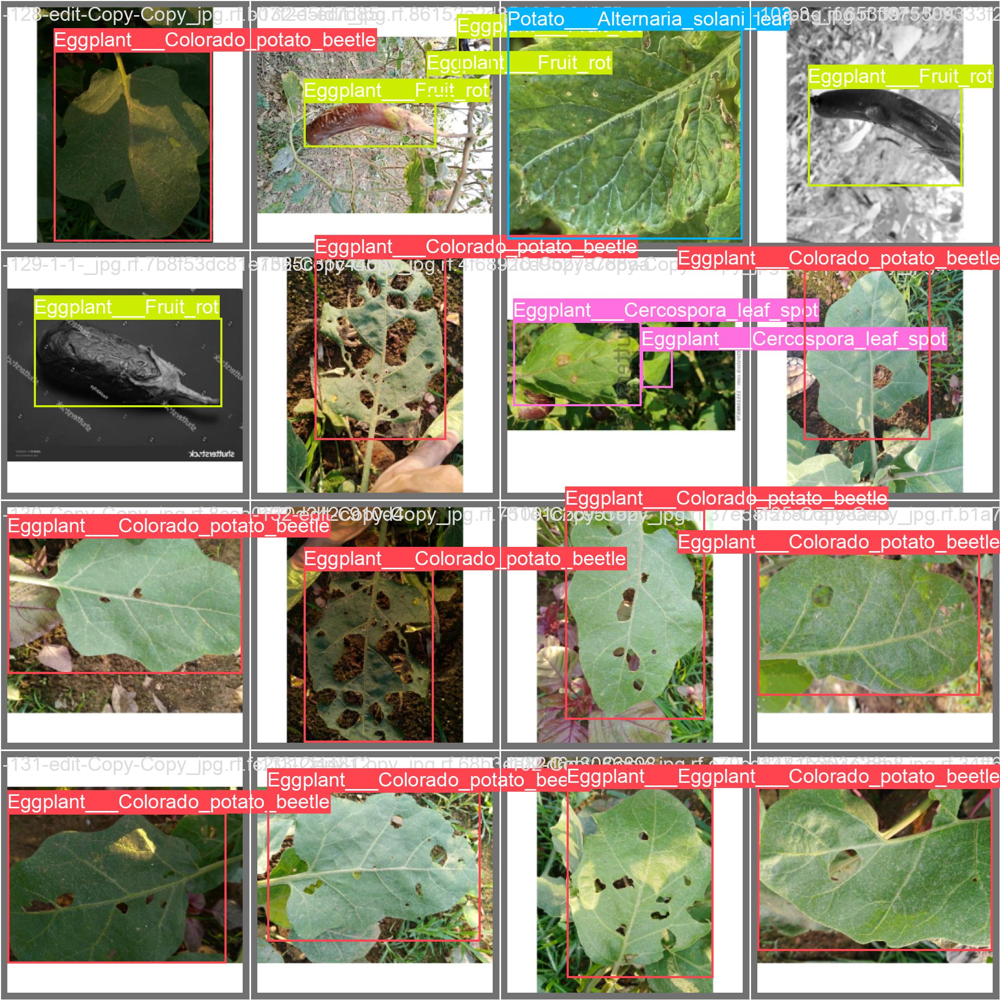

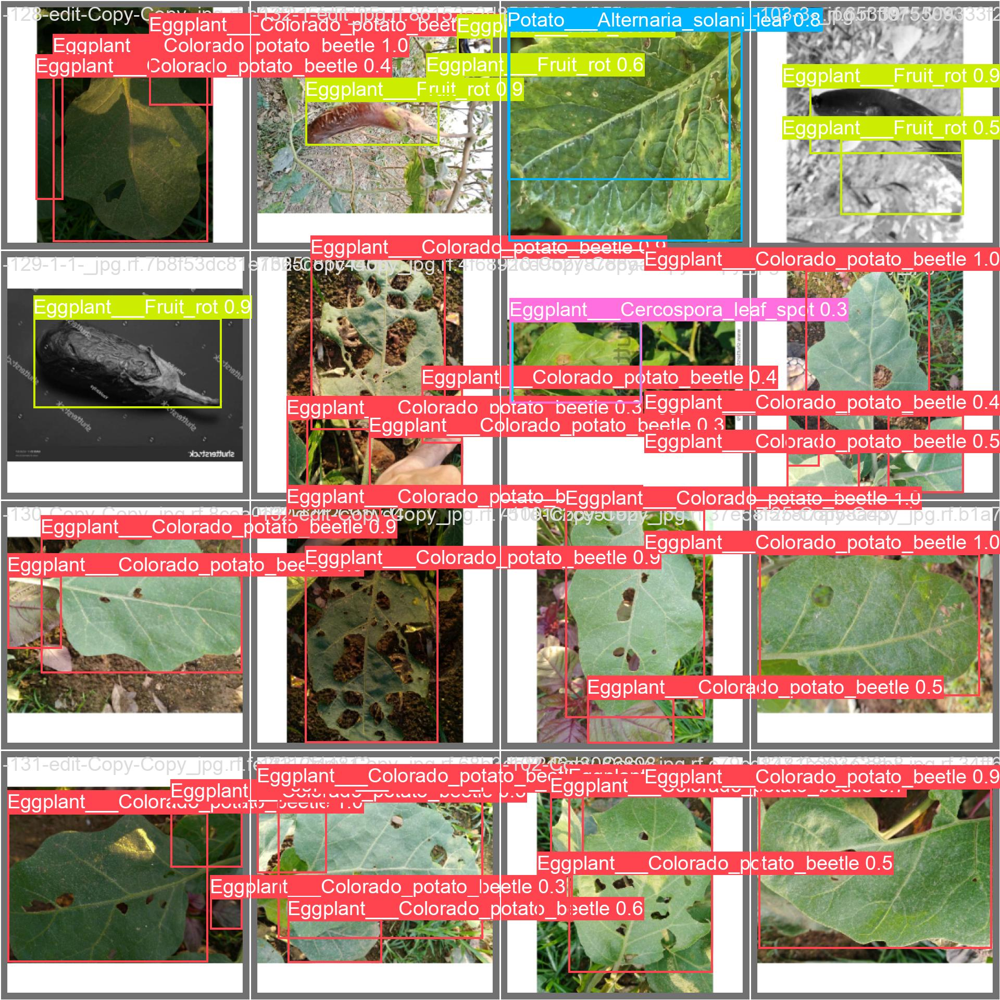

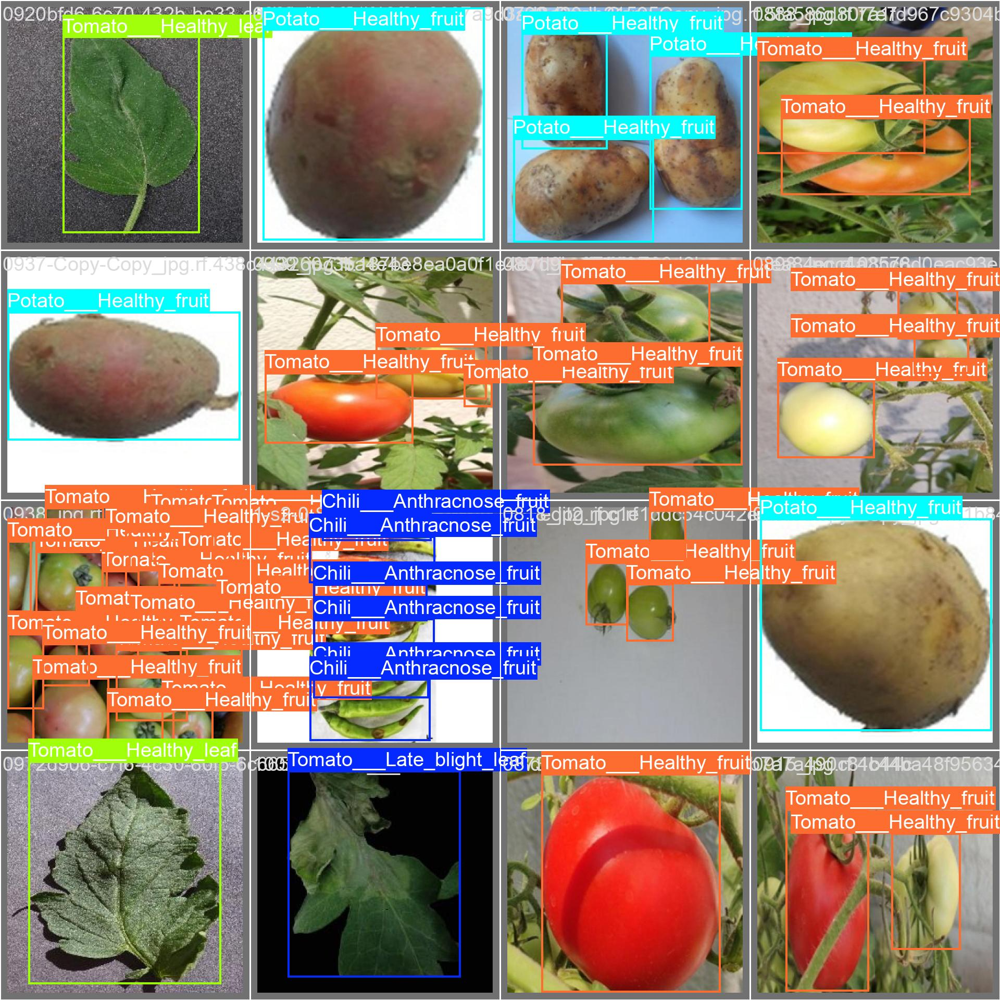

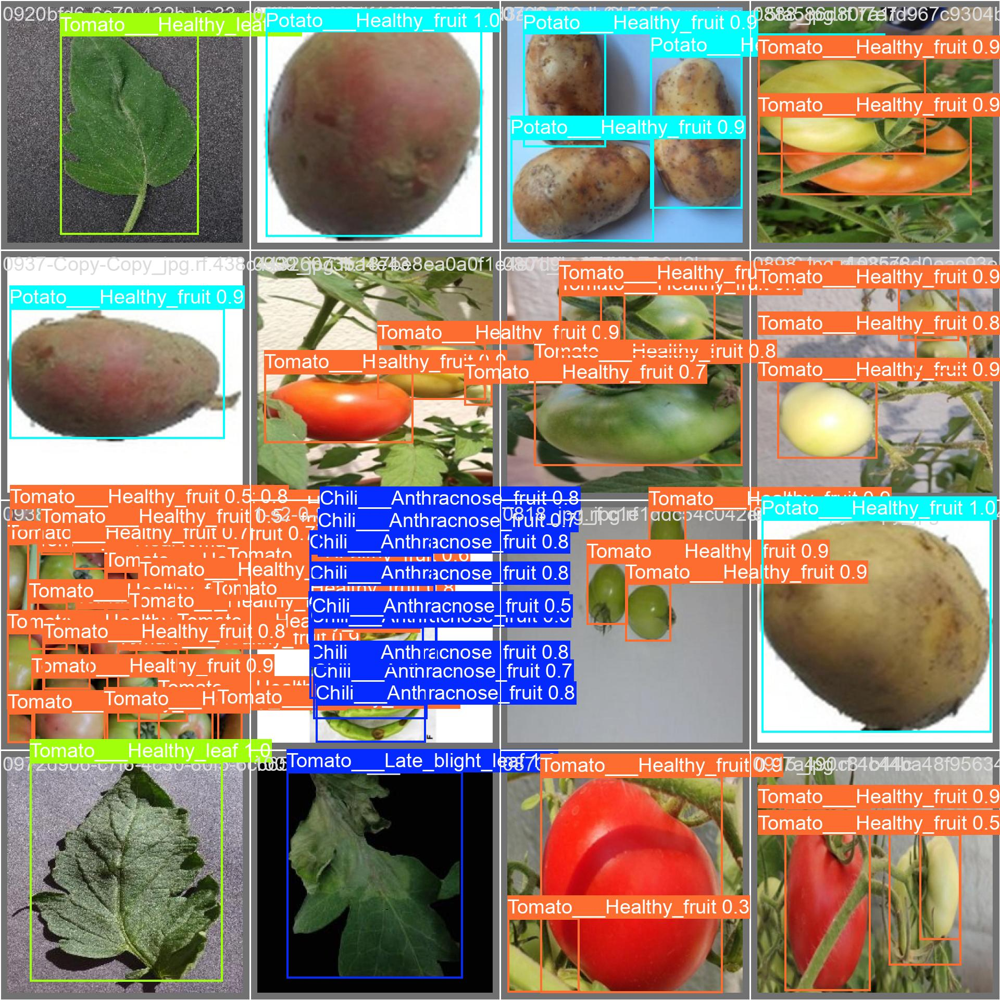

In [8]:
import os
from IPython.display import Image, display

folder_path = "/kaggle/working/ablation_runs/imgsz_5122"

# Loop through all files in the folder
for file in sorted(os.listdir(folder_path)):
    if file.lower().endswith((".png", ".jpg", ".jpeg")):  # image formats
        display(Image(filename=os.path.join(folder_path, file), width=800))

In [10]:
!pip install pyyaml
import yaml

path = "/kaggle/working/ablation_runs/imgsz_5122/args.yaml"

with open(path, 'r') as f:
    args_data = yaml.safe_load(f)

args_data
import pandas as pd

df = pd.DataFrame.from_dict(args_data, orient='index', columns=['Value'])
df.head(20)


,Value
task,detect
mode,train
model,yolo11x.pt
data,/kaggle/working/plant-disease-detection-1/data...
epochs,10
time,None
patience,100
batch,24
imgsz,512
save,True


In [11]:
pd.set_option('display.max_rows', None)
print(df)

                                                             Value
task                                                        detect
mode                                                         train
model                                                   yolo11x.pt
data             /kaggle/working/plant-disease-detection-1/data...
epochs                                                          10
time                                                          None
patience                                                       100
batch                                                           24
imgsz                                                          512
save                                                          True
save_period                                                     -1
cache                                                        False
device                                                        None
workers                                                       